# Exploratory Data Analysis

## Data Dictionary

In [1]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

#sklearn
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer, KNNImputer

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
# Import CSV created at end of previous section
df_20f = pd.read_csv('df_20f.csv')

In [3]:
# My final dataframe
eda_start = df_20f.copy()

In [4]:
'Import Excel spreadsheet with manually created data dictionary columns columns.'

data_dictionary = pd.read_excel('data_dictionary_whi.xlsx')

In [5]:
data_dictionary.head(3)

,# Columns,Column Name,Full Name,Data Format,Data Range,Description
0,1.0,country,Country Name,object,none,Official Name of the Country in Question
1,2.0,year,Year,int64,2005-2020,Year of the Data Observed
2,3.0,log_gdp,GDP per capita,float64,6.635 - 11.648,"GDP per capita in terms of PPP, taken from Wor..."


In [6]:
data_dictionary.sample()

,# Columns,Column Name,Full Name,Data Format,Data Range,Description
19,20.0,happiness_s,Happiness Score of countries,float64,2.37 - 8.01,"Estimated through elements like gdp, life expe..."


In [7]:
# Only start with dataframe from 2 colomn onwards
data_dictionary[['Column Name', 'Description']]

,Column Name,Description
0,country,Official Name of the Country in Question
1,year,Year of the Data Observed
2,log_gdp,"GDP per capita in terms of PPP, taken from Wor..."
3,social_s,"If in trouble, are there relatives or friends ..."
4,life_choices,If a person is satisfied or dissatiesfied with...
5,generosity,Whether a person have given money to charity i...
6,corruption,Perception of corruption within government and...
7,positive_a,"Average of previous-day affect of happiness, l..."
8,negative_a,"Average of previous-day affect of worries, sad..."
9,tot_alc_cons,"Average yearly alcohol consumption, reported i..."


## EDA

In [8]:
eda_start.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1745 entries, 0 to 1744
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    1745 non-null   int64  
 1   country       1745 non-null   object 
 2   year          1745 non-null   int64  
 3   happiness_s   1745 non-null   float64
 4   log_gdp       1735 non-null   float64
 5   social_s      1732 non-null   float64
 6   life_ex       1745 non-null   float64
 7   life_choices  1715 non-null   float64
 8   generosity    1684 non-null   float64
 9   corruption    1642 non-null   float64
 10  positive_a    1725 non-null   float64
 11  negative_a    1730 non-null   float64
 12  tot_alc_cons  410 non-null    float64
 13  population    1745 non-null   float64
 14  spirit_c      1745 non-null   float64
 15  wine_c        1745 non-null   float64
 16  beer_c        1745 non-null   float64
 17  forest_c      1745 non-null   float64
 18  u_pop         1745 non-null 

' Please remove ## if you want to save visualisation to your computer'

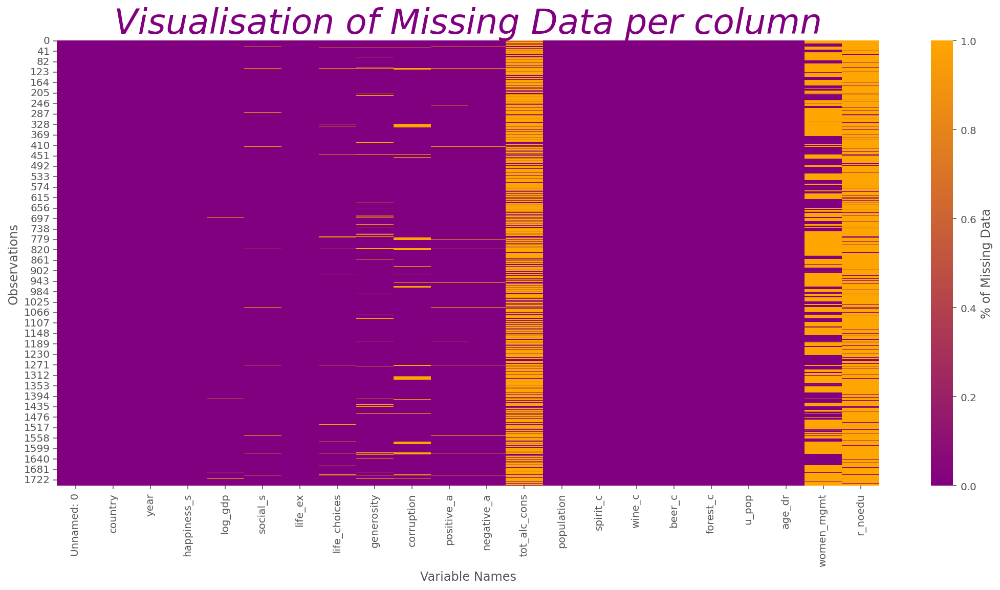

In [9]:
plt.figure(figsize=(18,8))

# Labelling chart
plt.title('Visualisation of Missing Data per column', fontsize = 34.0, color='Purple', fontstyle='italic')

#Plotting and labelling colour bar
# sns.heatmap(eda_start.isnull(),cmap=sns.color_palette("light:b_r", as_cmap=True), 
#             cbar_kws={'label': '% of Missing Data'},annot_kws={'size':16});

#Plotting and labelling colour bar
sns.heatmap(eda_start.isnull(),cmap=sns.color_palette("blend:purple,orange", as_cmap=True), 
            cbar_kws={'label': '% of Missing Data'},annot_kws={'size':16});

plt.xlabel('Variable Names')
plt.ylabel('Observations')

' Please remove ## if you want to save visualisation to your computer'
# Saving as image and pdf
##plt.savefig('Vis_Missing_Data_per_column.png',dpi=100)
##plt.savefig('Visualisation of Missing Data per column.pdf')

In [10]:
# % of missing.
for col in eda_start.columns:
    pct_missing = np.mean(eda_start[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

Unnamed: 0 - 0%
country - 0%
year - 0%
happiness_s - 0%
log_gdp - 1%
social_s - 1%
life_ex - 0%
life_choices - 2%
generosity - 3%
corruption - 6%
positive_a - 1%
negative_a - 1%
tot_alc_cons - 77%
population - 0%
spirit_c - 0%
wine_c - 0%
beer_c - 0%
forest_c - 0%
u_pop - 0%
age_dr - 0%
women_mgmt - 61%
r_noedu - 90%


### Investigating all the columns with missing values in order

#### Investigating correlation for all features with more than 1% missing data

In [11]:
# Creating necessary dataframes to plot correlations
one_plus = eda_start[['life_choices', 'generosity', 'corruption', 
                          'tot_alc_cons','women_mgmt','r_noedu']]

happiness = eda_start['happiness_s']

# All features with more than 1% of missing data
all_one_plus = eda_start[['happiness_s','life_choices', 'generosity', 'corruption', 
                          'tot_alc_cons','women_mgmt','r_noedu' ]]

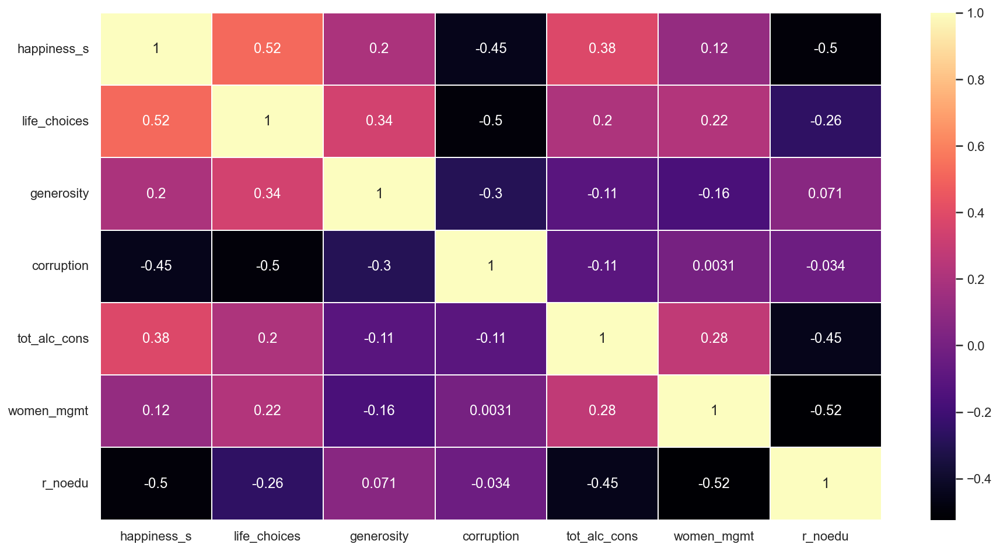

In [12]:
#Investigating correlation through heatmap for only features missing over 1% of their data
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap((all_one_plus).corr(), annot=True, 
            cmap='magma', linecolor='white', linewidths=1);

There are a couple of moderately negative (.5 -.7) collinearities.
These are between:
    
- corruption and life_choices (.5)
- women in management and ration of people with no formal education (.52)


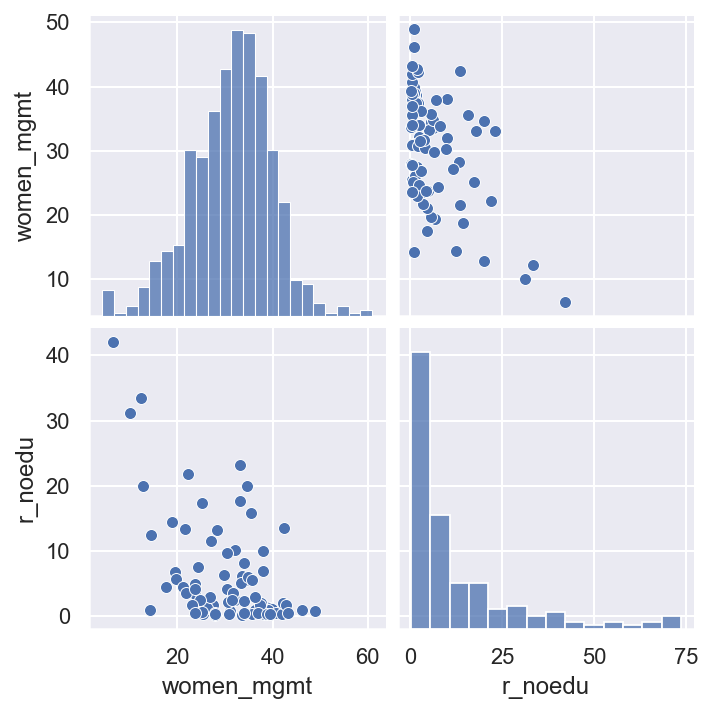

In [13]:
sns.pairplot(eda_start[['women_mgmt','r_noedu']]);

##### Although there is not sufficient collinearity between our two predictor variables, we will have to drop the ratio of not formally educated people (r_noedu) because of the amount of missing data. 

In [14]:
df_no_edu = eda_start.copy()

In [15]:
# Dropping r_noedu
df_no_edu = eda_start.drop(columns='r_noedu')

In [16]:
df_no_edu.sample()

,Unnamed: 0,country,year,happiness_s,log_gdp,social_s,life_ex,life_choices,generosity,corruption,...,negative_a,tot_alc_cons,population,spirit_c,wine_c,beer_c,forest_c,u_pop,age_dr,women_mgmt
1189,1189,Pakistan,2018,5.472,8.464,0.685,58.5,0.773,0.069,0.799,...,0.377,0.34,212228288.0,0.04,0.0,0.0,4.940561,36.666,65.515202,NaN


In [17]:
df_no_edu[['country','women_mgmt']].sample(40)

,country,women_mgmt
99,Azerbaijan,NaN
328,China,NaN
1087,Nepal,NaN
687,Iran,NaN
558,Germany,28.58
1341,Senegal,NaN
337,China,NaN
1030,Mongolia,40.01
217,Brazil,37.97
482,Estonia,31.63


##### There are simply too many missing values for women in management and while for some countries (less progressive) these values could be imputed with a zero, there are other countries (progressive) where it is more likely that we have no data. Thus, considering the substantial amount of data missing, we argue that it makes more sense to drop this column too. 

In [18]:
df_no_wom = df_no_edu.copy()

In [19]:
# Dropping women_mgmt column because of too much missing data
df_no_wom = df_no_edu.drop(columns='women_mgmt')

In [20]:
df_no_wom.sample()

,Unnamed: 0,country,year,happiness_s,log_gdp,social_s,life_ex,life_choices,generosity,corruption,positive_a,negative_a,tot_alc_cons,population,spirit_c,wine_c,beer_c,forest_c,u_pop,age_dr
275,275,Cameroon,2016,4.816,8.167,0.659,51.1,0.713,-0.003,0.879,0.662,0.367,NaN,23926549.0,0.01,0.14,2.43,43.503374,55.179,84.485152


In [21]:
# % of missing.
for col in df_no_wom.columns:
    pct_missing = np.mean(df_no_wom[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

Unnamed: 0 - 0%
country - 0%
year - 0%
happiness_s - 0%
log_gdp - 1%
social_s - 1%
life_ex - 0%
life_choices - 2%
generosity - 3%
corruption - 6%
positive_a - 1%
negative_a - 1%
tot_alc_cons - 77%
population - 0%
spirit_c - 0%
wine_c - 0%
beer_c - 0%
forest_c - 0%
u_pop - 0%
age_dr - 0%


In [22]:
df_no_wom.columns

Index(['Unnamed: 0', 'country', 'year', 'happiness_s', 'log_gdp', 'social_s',
       'life_ex', 'life_choices', 'generosity', 'corruption', 'positive_a',
       'negative_a', 'tot_alc_cons', 'population', 'spirit_c', 'wine_c',
       'beer_c', 'forest_c', 'u_pop', 'age_dr'],
      dtype='object')

#### Looking at collinearity between Alcohol related data

In [23]:
# Looking at collinearity between tot_alc_cons and likely related columns like 
# spirit consumption, wine consumption and beer consumption.
df_no_wom[['happiness_s','tot_alc_cons', 'spirit_c', 'wine_c', 'beer_c']].corr()

,happiness_s,tot_alc_cons,spirit_c,wine_c,beer_c
happiness_s,1.000000,0.381996,0.213384,0.487755,0.529151
tot_alc_cons,0.381996,1.000000,0.636733,0.663017,0.774819
spirit_c,0.213384,0.636733,1.000000,0.273141,0.497577
wine_c,0.487755,0.663017,0.273141,1.000000,0.564145
beer_c,0.529151,0.774819,0.497577,0.564145,1.000000


There are a couple of moderate positive (.5 -.7) collinearities between the predictors. These are between:

- Spirit and wine are moderately correlated with Total Alcohol Consumption
- Beer is strongly correlated with Total Alcohol Consumption
- Between Spirit, Wine and Beer the correlations are moderate at best

#### Investigating Variance Inflation Factor to add an additional perspective

In [24]:
#Compute VIF data for each of the above variables
from statsmodels.stats.outliers_influence import variance_inflation_factor

alc_features = df_no_wom[['spirit_c', 'wine_c', 'beer_c']]

vif = pd.DataFrame()
vif["features"] = alc_features.columns
vif["vif_factor"] = [variance_inflation_factor(alc_features.values, i) for i in range(alc_features.shape[1])]
vif

,features,vif_factor
0,spirit_c,2.404687
1,wine_c,2.155828
2,beer_c,3.568845


In [25]:
import hvplot.pandas
vif.hvplot.bar(x='features', y='vif_factor',title='Variance Inflation Factor')

:Bars   [features]   (vif_factor)

##### VIF for a regression model is equal to the ratio of the overall model variance compared to the variance of the model with only once specific feature (VIF = 1 / (1-r2)).  According to our research a VIF factor between 1 -5 indicates moderate correlation between the variables. Only beer consumption is over the halfway mark to the upper bound for moderate correlation. For now, we will leave all these features in our data frame and remove tot_alc_cons because of its strong correlation and amount of missing data. Yet again though, beer consumption catches our attention.

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [26]:
df_no_wom.columns

Index(['Unnamed: 0', 'country', 'year', 'happiness_s', 'log_gdp', 'social_s',
       'life_ex', 'life_choices', 'generosity', 'corruption', 'positive_a',
       'negative_a', 'tot_alc_cons', 'population', 'spirit_c', 'wine_c',
       'beer_c', 'forest_c', 'u_pop', 'age_dr'],
      dtype='object')

In [27]:
no_tot_alc = df_no_wom.copy()

In [28]:
no_tot_alc = df_no_wom.drop(columns='tot_alc_cons')

In [29]:
no_tot_alc.sample()

,Unnamed: 0,country,year,happiness_s,log_gdp,social_s,life_ex,life_choices,generosity,corruption,positive_a,negative_a,population,spirit_c,wine_c,beer_c,forest_c,u_pop,age_dr
75,75,Australia,2018,7.177,10.811,0.94,73.6,0.916,0.146,0.405,0.759,0.187,24898153.0,1.32,3.67,3.71,17.373962,86.012,53.485088


In [30]:
# % of missing.
for col in no_tot_alc.columns:
    pct_missing = np.mean(no_tot_alc[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

Unnamed: 0 - 0%
country - 0%
year - 0%
happiness_s - 0%
log_gdp - 1%
social_s - 1%
life_ex - 0%
life_choices - 2%
generosity - 3%
corruption - 6%
positive_a - 1%
negative_a - 1%
population - 0%
spirit_c - 0%
wine_c - 0%
beer_c - 0%
forest_c - 0%
u_pop - 0%
age_dr - 0%


### Looking at imputation options for remaining predictors.

In [31]:
# Create a copy before considering imputation options
corr_fix = no_tot_alc.copy()

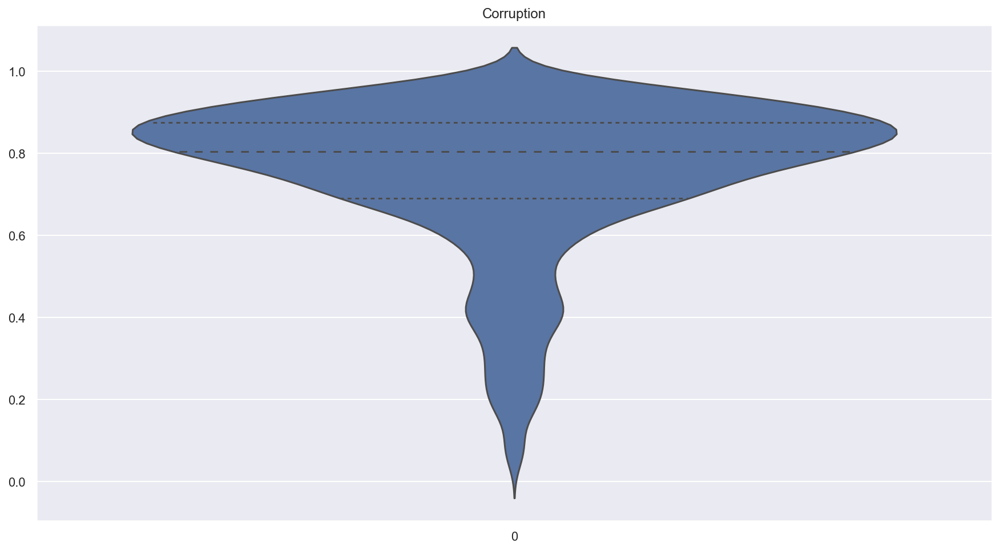

In [32]:
# Combo plot Violin and Beeswarm for corruption column
plt.title(label='Corruption')
sns.violinplot(data=corr_fix['corruption'], inner='quartile', bw=.2);

In [33]:
corr_fix.corruption.describe()

count    1642.000000
mean        0.748828
std         0.186927
min         0.035000
25%         0.691000
50%         0.804500
75%         0.875000
max         0.983000
Name: corruption, dtype: float64

In [34]:
corr_fix.corruption.skew()

-1.5219473298800232

In [35]:
import hvplot.pandas
corr_fix.corruption.hvplot.hist(title='Perception of Corruption')

:Histogram   [corruption]   (corruption_count)

##### The corruption data is highly negatively skewed with a value of over one (-1.52), thus imputing the data with average would not be suitable because of the long left tail influencing our mean negatively. This is demonstrated in the overview above (describe) where the mean is lower as the median (50% range). One way of imputing our data would therefore be the median, which is not impacted by the skew of the data.

In [36]:
# This would fix all NaN columns and input the mean or median of the column 
corr_mean_fix = corr_fix.corruption.transform(lambda x: x.fillna(x.mean()))
corr_median_fix = corr_fix.corruption.transform(lambda x: x.fillna(x.median()))

In [37]:
print('Original variable variance: ', corr_fix.corruption.var())
print('Variance after median imputation: ', corr_median_fix.var())
print('Variance after mean imputation: ', corr_mean_fix.var())

Original variable variance:  0.03494174541421441
Variance after median imputation:  0.033050344134125054
Variance after mean imputation:  0.032878098752709785


##### As previously suggested, imputing the corruption data with the mean would understate the variance by the most, when compared to the original data. Therefore, it made sense, imputing with the median.

### Visualising Imputation Impact on Corruption

' Please remove ## if you want to save visualisation to your computer'

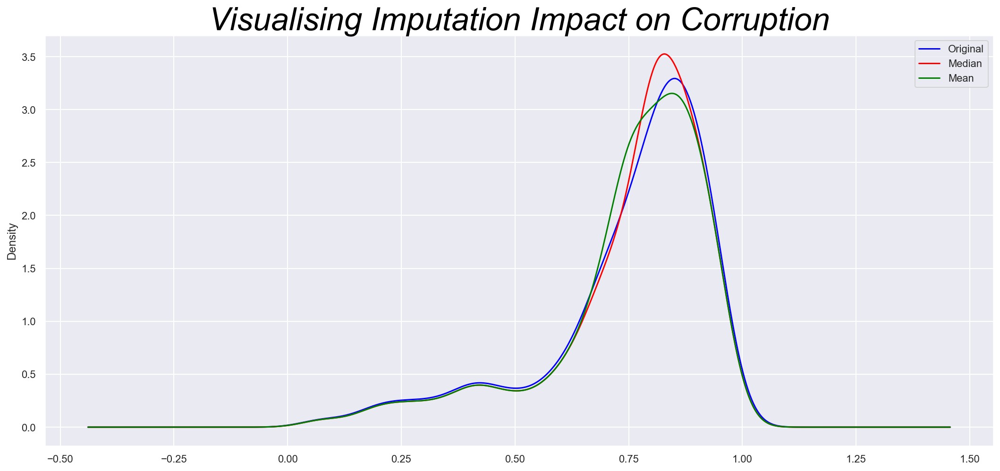

In [38]:
fig = plt.figure(figsize=(18,8))
ax = fig.add_subplot(111)

# Labelling chart
plt.title('Visualising Imputation Impact on Corruption', fontsize = 34.0, color='Black', fontstyle='italic')

# original variable distribution
corr_fix['corruption'].plot(kind='kde', ax=ax,color='blue', label="Original")

# variable imputed with the median
corr_median_fix.plot(kind='kde', ax=ax, color='red', label='Median')

# variable imputed with the mean
corr_mean_fix.plot(kind='kde', ax=ax, color='green', label='Mean')

plt.ylabel('Density')

plt.legend();

' Please remove ## if you want to save visualisation to your computer'
# Saving as image and pdf
##plt.savefig('Vis_Imputation_Impact_Corruption.png',dpi=100)
##plt.savefig('Visualising Imputation Impact on Corruption.pdf')


#### This visual example imputation proves the point, that mean imputation (green) would be an inappropriate course to follow for imputation of our corruption data.

In [39]:
corr_fix.sample()

,Unnamed: 0,country,year,happiness_s,log_gdp,social_s,life_ex,life_choices,generosity,corruption,positive_a,negative_a,population,spirit_c,wine_c,beer_c,forest_c,u_pop,age_dr
1431,1431,South Korea,2017,5.874,10.621,0.807,73.3,0.538,0.014,0.851,0.623,0.235,51096408.0,0.24,0.14,1.8,64.783099,81.503,37.13235


In [40]:
# Adding median imputed corruption column to my dataframe
corr_fix['corruption'] = corr_median_fix

In [41]:
corr_fix.columns

Index(['Unnamed: 0', 'country', 'year', 'happiness_s', 'log_gdp', 'social_s',
       'life_ex', 'life_choices', 'generosity', 'corruption', 'positive_a',
       'negative_a', 'population', 'spirit_c', 'wine_c', 'beer_c', 'forest_c',
       'u_pop', 'age_dr'],
      dtype='object')

### Approaching missing imputations for variables with less than 5% missing data.

In [42]:
# Creating a copy before dealing with missing values below 5%
less5pct = corr_fix.copy()

In [43]:
# missing values in percentage of data series concerned
missing_values = less5pct[['log_gdp','social_s','negative_a',
                           'positive_a','life_choices' ]].isnull().sum()

missing_pct = missing_values / len(less5pct) *100

missing_pct.sort_values(ascending=False)

life_choices    1.719198
positive_a      1.146132
negative_a      0.859599
social_s        0.744986
log_gdp         0.573066
dtype: float64

In [44]:
# Creating a dataset without the missing values

data_cca = less5pct.dropna()
less5pct.shape, data_cca.shape
diff = round(((len(less5pct)-len(data_cca))/len(less5pct)*100),2)

print(f'Original shape {less5pct.shape}.')
print(f'New shape {data_cca.shape}.')
print(f'Data we would lose because of dropping columns missing less than 5% of data is {diff}%.')

Original shape (1745, 19).
New shape (1650, 19).
Data we would lose because of dropping columns missing less than 5% of data is 5.44%.


#### We should verify the distribution of our data and compare it before and after dropping the missing values.

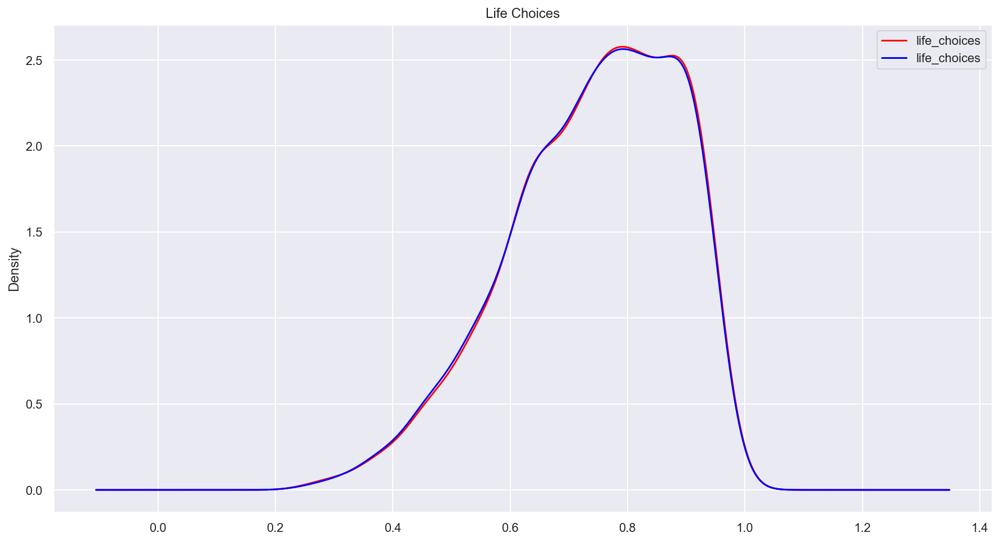

In [45]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.title(label='Life Choices')


# original data
less5pct['life_choices'].plot.density(color='red')

# data after cca
data_cca['life_choices'].plot.density(color='blue')

plt.legend();

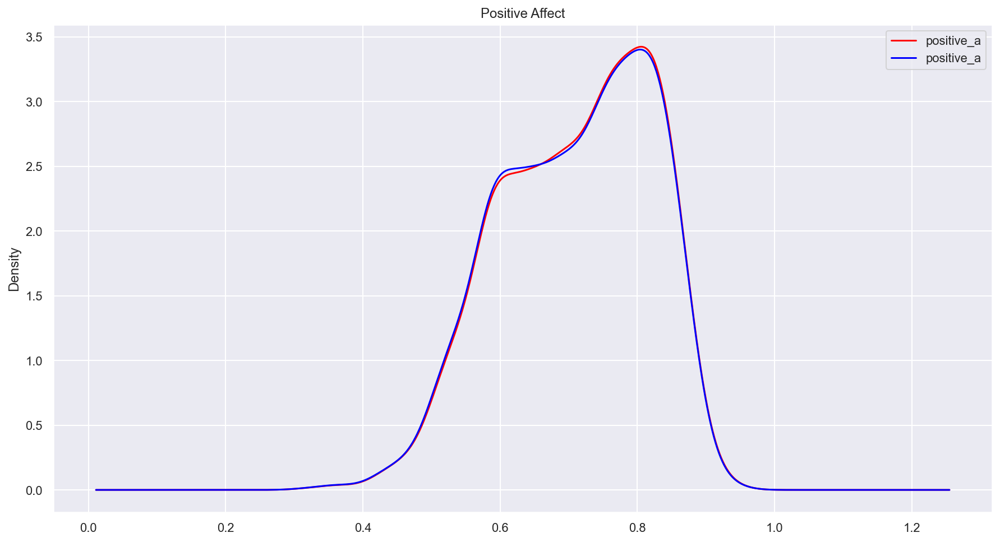

In [46]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.title(label='Positive Affect')

# original data
less5pct['positive_a'].plot.density(color='red')

# data after cca
data_cca['positive_a'].plot.density(color='blue')

plt.legend();

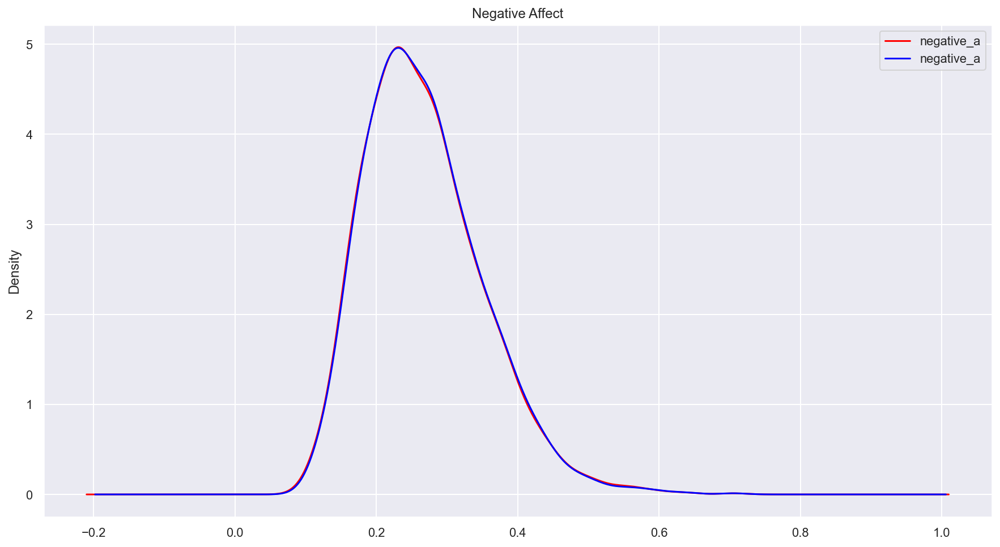

In [47]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.title(label='Negative Affect')

# original data
less5pct['negative_a'].plot.density(color='red')

# data after cca
data_cca['negative_a'].plot.density(color='blue')

plt.legend();

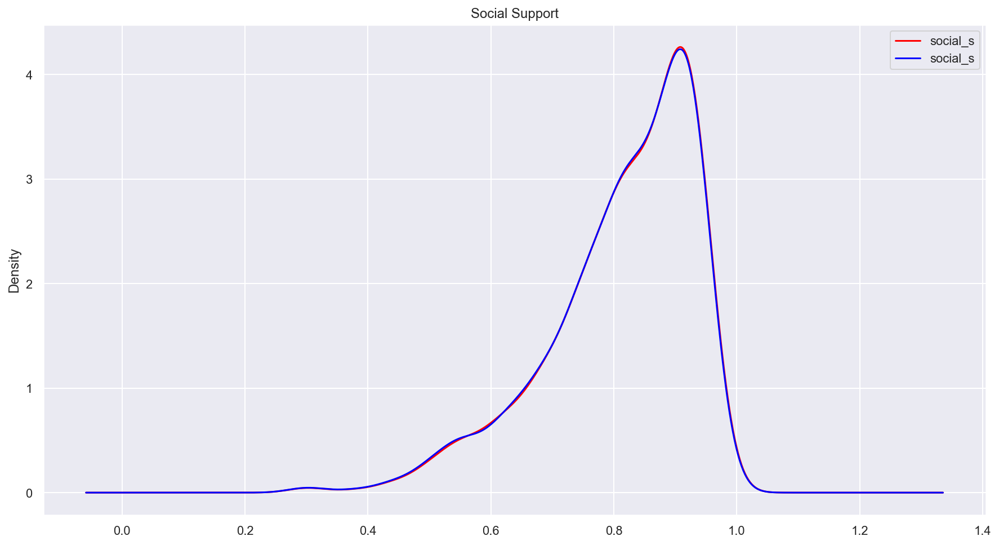

In [48]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.title(label='Social Support')

# original data
less5pct['social_s'].plot.density(color='red')

# data after cca
data_cca['social_s'].plot.density(color='blue')

plt.legend();

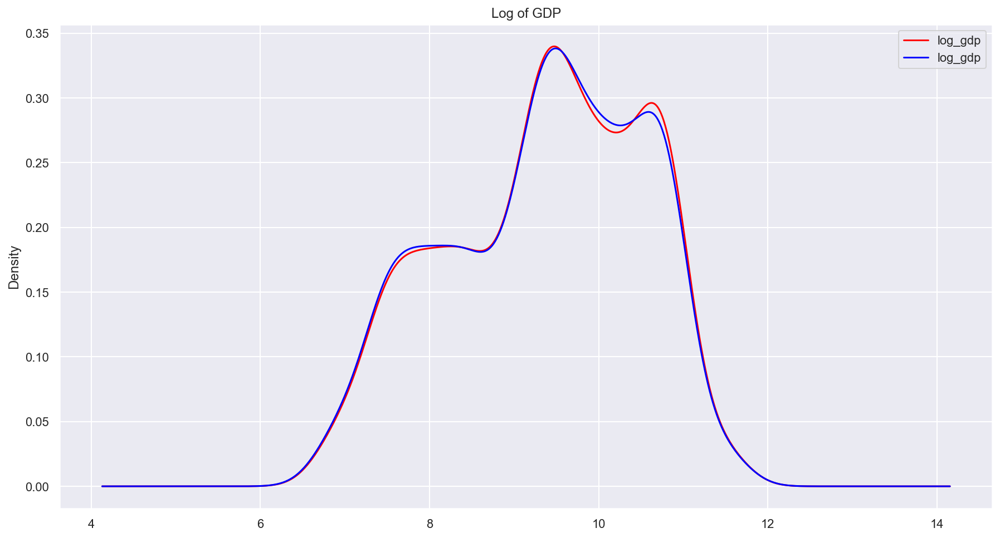

In [49]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.title(label='Log of GDP')

# original data
less5pct['log_gdp'].plot.density(color='red')

# data after cca
data_cca['log_gdp'].plot.density(color='blue')

plt.legend();

##### After comparing the distribution of our data before and after dropping the columns in accordance with the complete case analysis (CCA) approach, we can see that the distribution of the values is indeed very similar. This is in line with expectations in cases where missing values are at random and only applicable for a small portion of the observations.

In [50]:
print('Original variable variance:')
print(less5pct[['log_gdp','social_s',
                'negative_a','positive_a','life_choices' ]].var())
print('-----------------------------------------------------------------')
print('Variance after dropping data:')
print(data_cca[['log_gdp','social_s',
                'negative_a','positive_a','life_choices' ]].var())
print('-----------------------------------------------------------------')

Original variable variance:
log_gdp         1.331411
social_s        0.014418
negative_a      0.006984
positive_a      0.011788
life_choices    0.020335
dtype: float64
-----------------------------------------------------------------
Variance after dropping data:
log_gdp         1.334609
social_s        0.014553
negative_a      0.006890
positive_a      0.011869
life_choices    0.020390
dtype: float64
-----------------------------------------------------------------


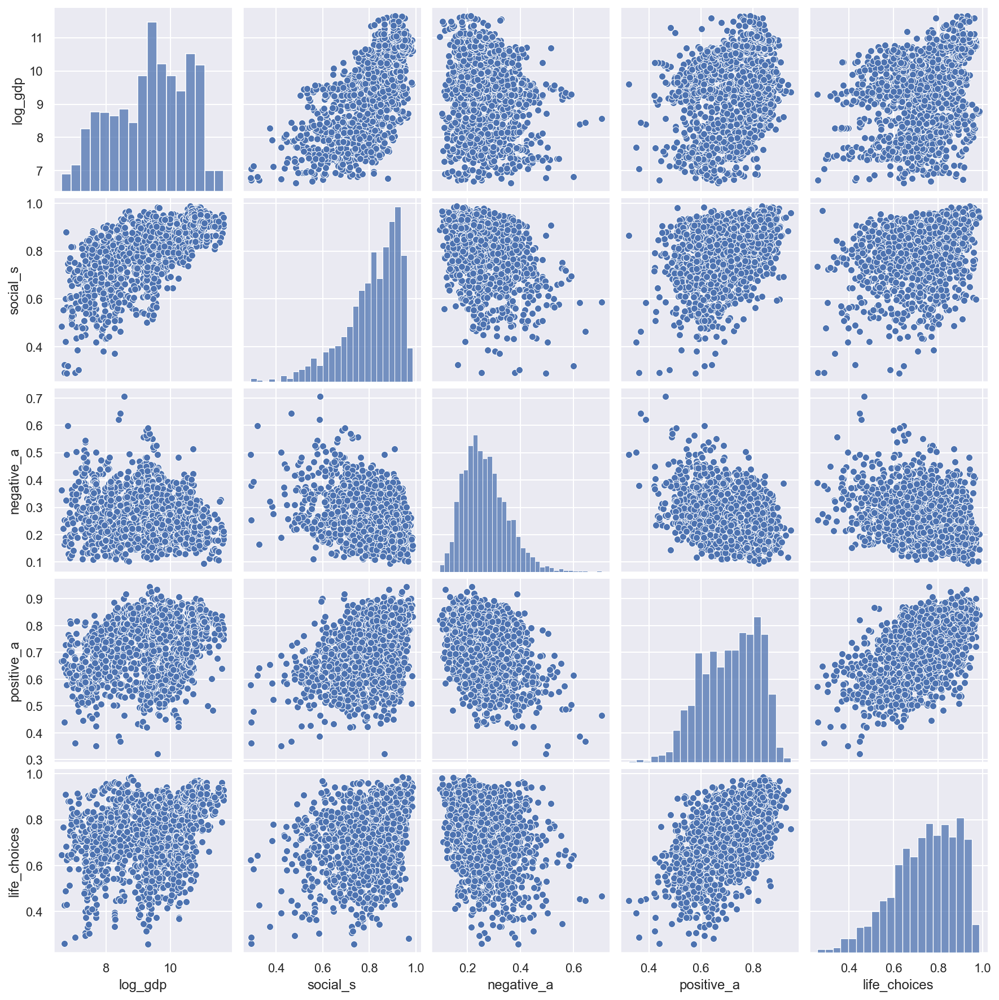

In [51]:
# Further visually investigating our features missing less than 5% of values
l5f = less5pct[['log_gdp','social_s','negative_a','positive_a','life_choices' ]]

sns.pairplot(l5f);

In [52]:
l5f.skew()

log_gdp        -0.308279
social_s       -1.144640
negative_a      0.827777
positive_a     -0.390750
life_choices   -0.609978
dtype: float64

#### Looking at the range of skew bands
- -0.5 to 0.5 for fairly symmetrical data
- Between absolute 1 and 0.5 for moderately skewed data
- Greater than absolute 1 for highly skewed data

#### 80% of the remaining data is between fairly and moderately skewed. Only Social Support is highly skewed. We will verify what happens to our data and looking at what difference it makes to impute the missing data with either mean or median.

In [53]:
l5f.columns

Index(['log_gdp', 'social_s', 'negative_a', 'positive_a', 'life_choices'], dtype='object')

#### We will now create two data frames where we impute the missing values for all the columns with less than 5% of data missing with either the mean or the median. This is merely for demonstration purpose, as we could impute all but the social support column with their mean, because the data is moderately skewed at best. 

In [54]:
# Creating two new dataframes to impute mean and median
mean_df = corr_fix.copy()
median_df = corr_fix.copy()

In [55]:
df_mean = mean_df.fillna(mean_df.mean())
df_median = median_df.fillna(median_df.median())

/var/folders/b2/wsl4pn8x4lz_9scydxm8jkkm0000gn/T/ipykernel_1292/743753603.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_mean = mean_df.fillna(mean_df.mean())
/var/folders/b2/wsl4pn8x4lz_9scydxm8jkkm0000gn/T/ipykernel_1292/743753603.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_median = median_df.fillna(median_df.median())


In [56]:
lf5_mean = df_mean[['log_gdp', 'social_s', 'negative_a', 
                    'positive_a', 'life_choices']]

In [57]:
lf5_median = df_median[['log_gdp', 'social_s', 'negative_a', 
                        'positive_a', 'life_choices']]

### Visualising the distribution with different imputation methods

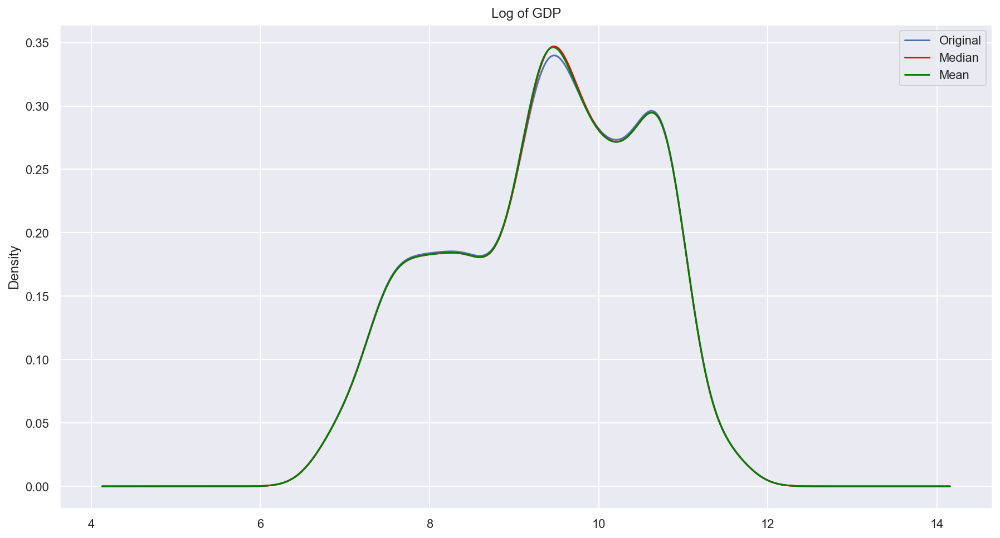

In [58]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.title(label='Log of GDP')

# original variable distribution
corr_fix['log_gdp'].plot(kind='kde', ax=ax, label="Original")

# variable imputed with the median
lf5_median['log_gdp'].plot(kind='kde', ax=ax, color='red', label='Median')

# variable imputed with the mean
lf5_mean['log_gdp'].plot(kind='kde', ax=ax, color='green', label='Mean')

plt.legend();

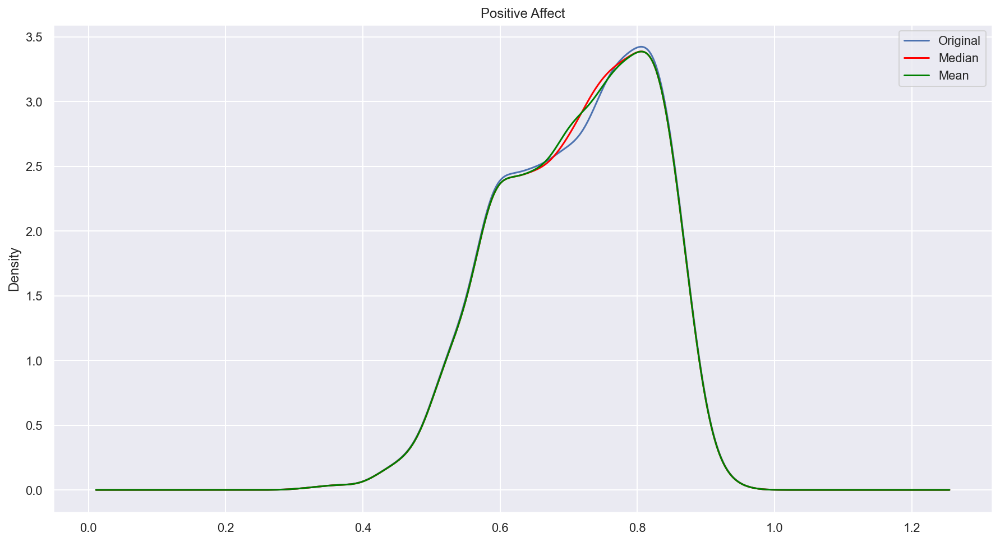

In [59]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.title(label='Positive Affect')

# original variable distribution
corr_fix['positive_a'].plot(kind='kde', ax=ax, label="Original")

# variable imputed with the median
lf5_median['positive_a'].plot(kind='kde', ax=ax, color='red', label='Median')

# variable imputed with the mean
lf5_mean['positive_a'].plot(kind='kde', ax=ax, color='green', label='Mean')

plt.legend();

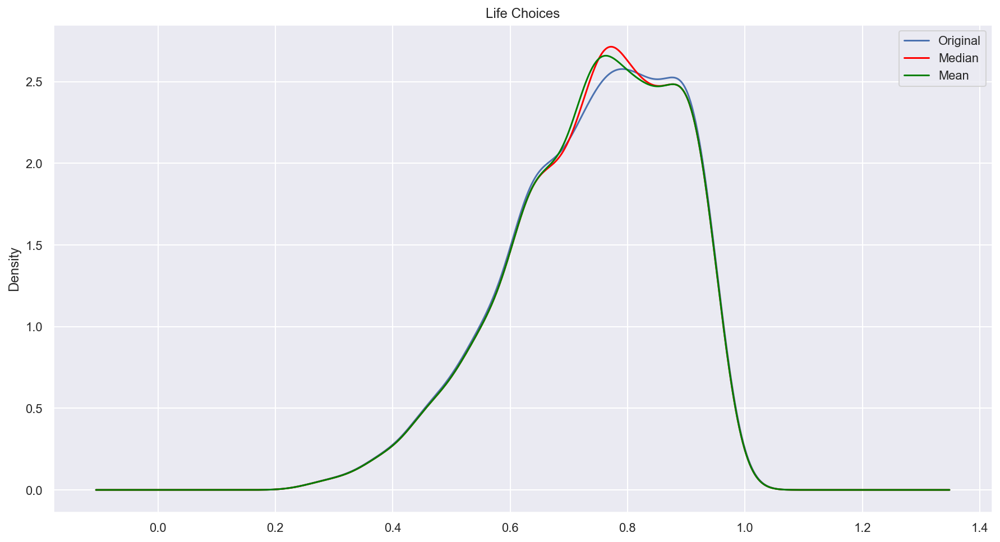

In [60]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.title(label='Life Choices')

# original variable distribution
corr_fix['life_choices'].plot(kind='kde', ax=ax, label="Original")

# variable imputed with the median
lf5_median['life_choices'].plot(kind='kde', ax=ax, color='red', label='Median')

# variable imputed with the mean
lf5_mean['life_choices'].plot(kind='kde', ax=ax, color='green', label='Mean')

plt.legend();

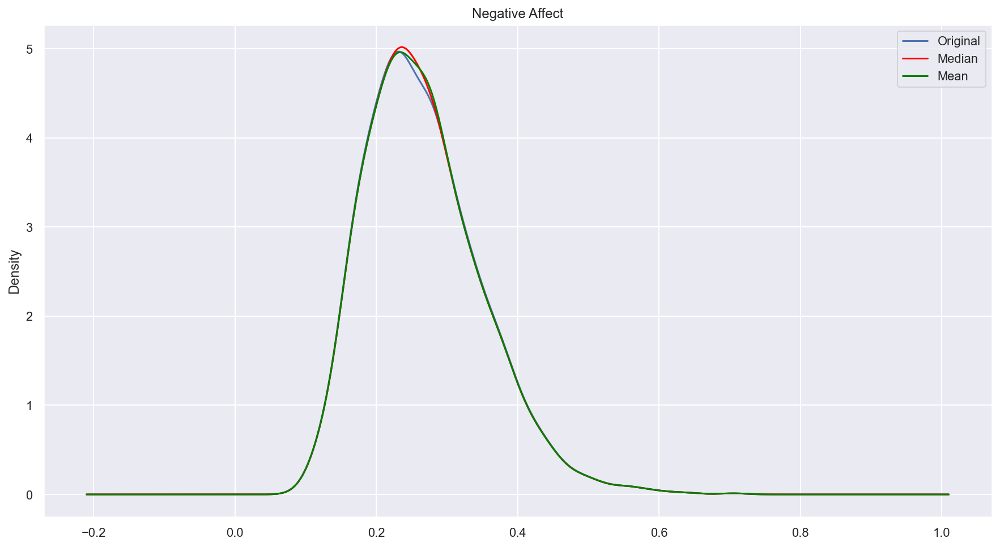

In [61]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.title(label='Negative Affect')

# original variable distribution
corr_fix['negative_a'].plot(kind='kde', ax=ax, label="Original")

# variable imputed with the median
lf5_median['negative_a'].plot(kind='kde', ax=ax, color='red', label='Median')

# variable imputed with the mean
lf5_mean['negative_a'].plot(kind='kde', ax=ax, color='green', label='Mean')

plt.legend();

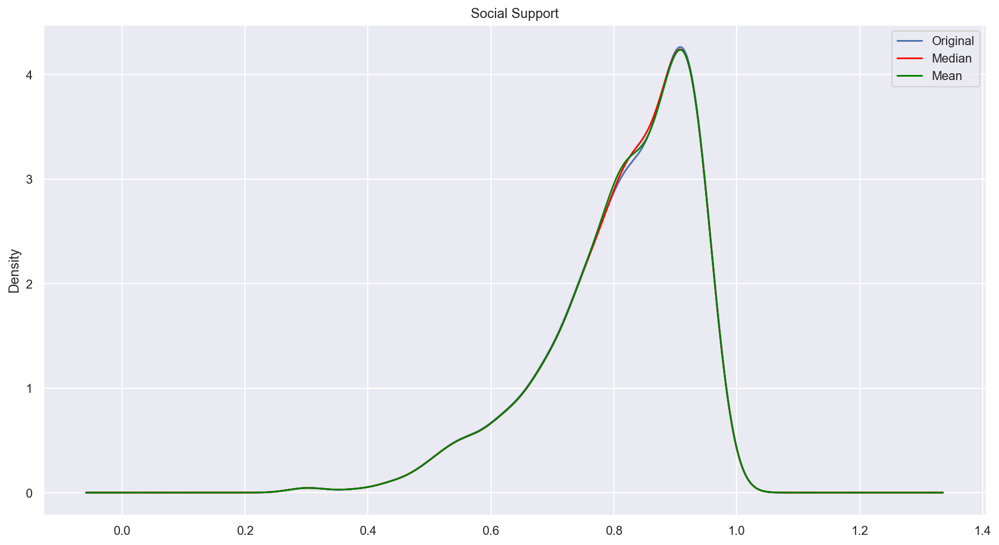

In [62]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.title(label='Social Support')

# original variable distribution
corr_fix['social_s'].plot(kind='kde', ax=ax, label="Original")

# variable imputed with the median
lf5_median['social_s'].plot(kind='kde', ax=ax, color='red', label='Median')

# variable imputed with the mean
lf5_mean['social_s'].plot(kind='kde', ax=ax, color='green', label='Mean')

plt.legend();

In [63]:
print('Original variable variance:')
print(l5f.var())
print('-----------------------------------------------------------------')
print('Variance after median imputation:')
print(lf5_median.var())
print('-----------------------------------------------------------------')
print('Variance after mean imputation:')
print(lf5_mean.var())
print('-----------------------------------------------------------------')
print('Variance after dropping missing data:')
print(data_cca[['log_gdp','social_s',
                'negative_a','positive_a','life_choices' ]].var())

Original variable variance:
log_gdp         1.331411
social_s        0.014418
negative_a      0.006984
positive_a      0.011788
life_choices    0.020335
dtype: float64
-----------------------------------------------------------------
Variance after median imputation:
log_gdp         1.323834
social_s        0.014315
negative_a      0.006925
positive_a      0.011655
life_choices    0.019991
dtype: float64
-----------------------------------------------------------------
Variance after mean imputation:
log_gdp         1.323777
social_s        0.014310
negative_a      0.006924
positive_a      0.011653
life_choices    0.019985
dtype: float64
-----------------------------------------------------------------
Variance after dropping missing data:
log_gdp         1.334609
social_s        0.014553
negative_a      0.006890
positive_a      0.011869
life_choices    0.020390
dtype: float64


In [64]:
# Creating a dataframe of results for better overview
l5f_var_df = pd.DataFrame(data=l5f.var(),columns=['orignal_var'])
l5f_var_df

,orignal_var
log_gdp,1.331411
social_s,0.014418
negative_a,0.006984
positive_a,0.011788
life_choices,0.020335


In [65]:
# Creating remaing dataframes for median, mean and cca
lf5_med_df = pd.DataFrame(data=lf5_median.var(),columns=['median_var'])
lf5_mean_df = pd.DataFrame(data=lf5_mean.var(), columns=['mean_var'])
lf5_cca_df = pd.DataFrame(data=data_cca[['log_gdp','social_s',
                                         'negative_a','positive_a',
                                         'life_choices' ]].var(),
                          columns=['cca_var'])

In [66]:
# Create copies for safety before merging
org_var = l5f_var_df.copy()
med_var = lf5_med_df.copy()
mean_var = lf5_mean_df.copy()
cca_var = lf5_cca_df.copy()

In [67]:
# Merging dataframes on index
merge_var_med = l5f_var_df.merge(lf5_med_df,left_index=True,
                                right_index=True)
merge_var_med

,orignal_var,median_var
log_gdp,1.331411,1.323834
social_s,0.014418,0.014315
negative_a,0.006984,0.006925
positive_a,0.011788,0.011655
life_choices,0.020335,0.019991


In [68]:
add_mean = merge_var_med.merge(lf5_mean_df, left_index=True,
                               right_index=True)
add_mean

,orignal_var,median_var,mean_var
log_gdp,1.331411,1.323834,1.323777
social_s,0.014418,0.014315,0.014310
negative_a,0.006984,0.006925,0.006924
positive_a,0.011788,0.011655,0.011653
life_choices,0.020335,0.019991,0.019985


In [69]:
add_cca = add_mean.merge(lf5_cca_df, left_index=True,
                        right_index=True)
print('This is the data frame with all imputation methods.')
add_cca

This is the data frame with all imputation methods.


,orignal_var,median_var,mean_var,cca_var
log_gdp,1.331411,1.323834,1.323777,1.334609
social_s,0.014418,0.014315,0.014310,0.014553
negative_a,0.006984,0.006925,0.006924,0.006890
positive_a,0.011788,0.011655,0.011653,0.011869
life_choices,0.020335,0.019991,0.019985,0.020390


In [70]:
add_cca.columns

Index(['orignal_var', 'median_var', 'mean_var', 'cca_var'], dtype='object')

In [71]:
# Export dataframe as png
import dataframe_image as dfi
dfi.export(add_cca,'imputation_data_frame.png')

[0314/202922.187307:INFO:headless_shell.cc(659)] Written to file /var/folders/b2/wsl4pn8x4lz_9scydxm8jkkm0000gn/T/tmpsualutod/temp.png.


In [72]:
print('Variance difference between Original and Median imputed data')
lf5_median.var() - l5f.var()

Variance difference between Original and Median imputed data


log_gdp        -0.007577
social_s       -0.000103
negative_a     -0.000059
positive_a     -0.000133
life_choices   -0.000344
dtype: float64

In [73]:
print('Variance difference between Original and dropped data')
data_cca[['log_gdp','social_s',
                'negative_a','positive_a','life_choices' ]].var() - l5f.var()

Variance difference between Original and dropped data


log_gdp         0.003198
social_s        0.000136
negative_a     -0.000094
positive_a      0.000081
life_choices    0.000055
dtype: float64

#### We will use median imputation, as there generally speaking less difference in the variance, when compared to the original (not imputed) data but more importantly the imputation does not overstate the variance, as it would if the data was deleted.

In [74]:
# Creating a new dataframe where all missing values will be imputed with
# median, because of previously discussed reasons.
mean_imputed = corr_fix.copy()

mean_imputed = corr_fix.transform(lambda x: x.fillna(x.median()))

/var/folders/b2/wsl4pn8x4lz_9scydxm8jkkm0000gn/T/ipykernel_1292/1598667395.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mean_imputed = corr_fix.transform(lambda x: x.fillna(x.median()))


In [75]:
mean_imputed.isnull().sum()

Unnamed: 0      0
country         0
year            0
happiness_s     0
log_gdp         0
social_s        0
life_ex         0
life_choices    0
generosity      0
corruption      0
positive_a      0
negative_a      0
population      0
spirit_c        0
wine_c          0
beer_c          0
forest_c        0
u_pop           0
age_dr          0
dtype: int64

In [76]:
# Dropping column not longer needed
#mean_imputed.drop(['median_corr'], axis=1, inplace=True)

In [77]:
# renaming Forest cover column
mean_imputed.rename(columns ={
    'Forest cover':'forest_c'}, inplace=True)

In [78]:
mean_imputed.columns

Index(['Unnamed: 0', 'country', 'year', 'happiness_s', 'log_gdp', 'social_s',
       'life_ex', 'life_choices', 'generosity', 'corruption', 'positive_a',
       'negative_a', 'population', 'spirit_c', 'wine_c', 'beer_c', 'forest_c',
       'u_pop', 'age_dr'],
      dtype='object')

#### Verifying distribution of target variable

In [79]:
mean_imputed.happiness_s.hvplot.hist()

:Histogram   [happiness_s]   (happiness_s_count)

In [80]:
mean_imputed.happiness_s.skew()

0.07492121522696024

##### Target variable is within normal distribution range. No action required.

### Dealing with Outliers

In [81]:
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

In [82]:
mean_imputed.columns

Index(['Unnamed: 0', 'country', 'year', 'happiness_s', 'log_gdp', 'social_s',
       'life_ex', 'life_choices', 'generosity', 'corruption', 'positive_a',
       'negative_a', 'population', 'spirit_c', 'wine_c', 'beer_c', 'forest_c',
       'u_pop', 'age_dr'],
      dtype='object')

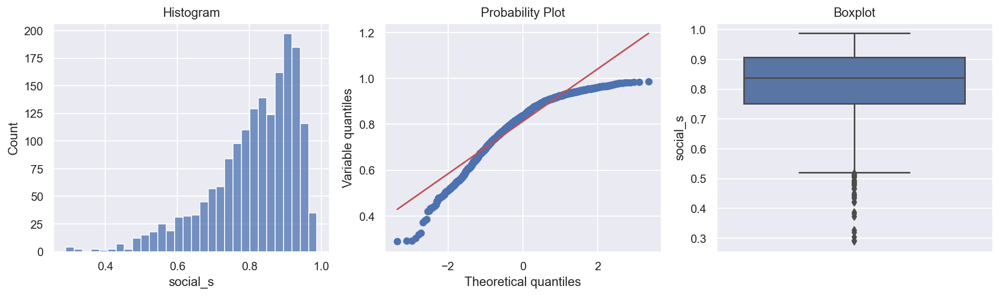

In [83]:
# let's find outliers in social_s
diagnostic_plots(mean_imputed, 'social_s')

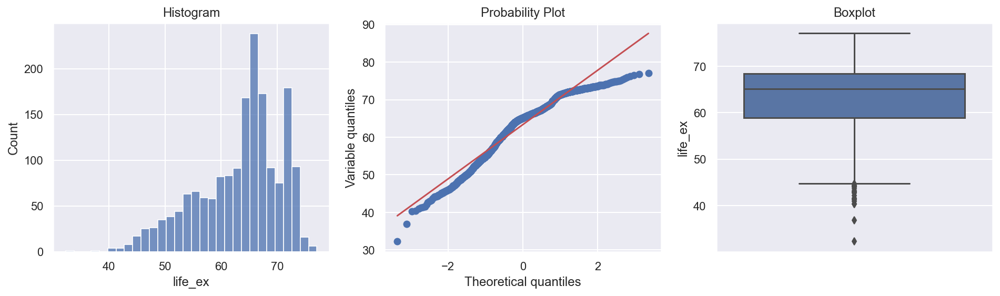

In [84]:
# let's find outliers in life_ex
diagnostic_plots(mean_imputed, 'life_ex')

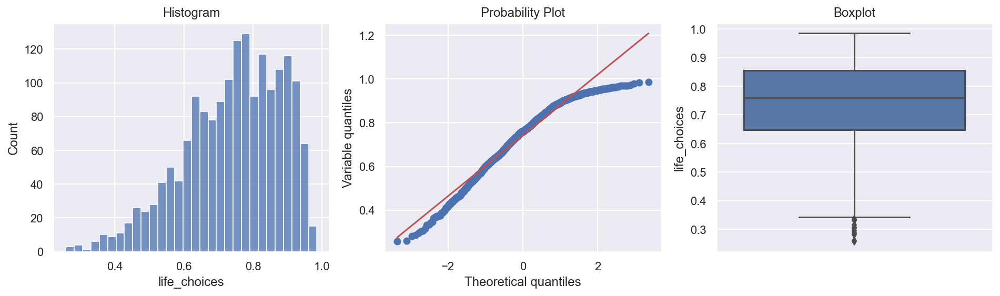

In [85]:
# let's find outliers in life_choices
diagnostic_plots(mean_imputed, 'life_choices')

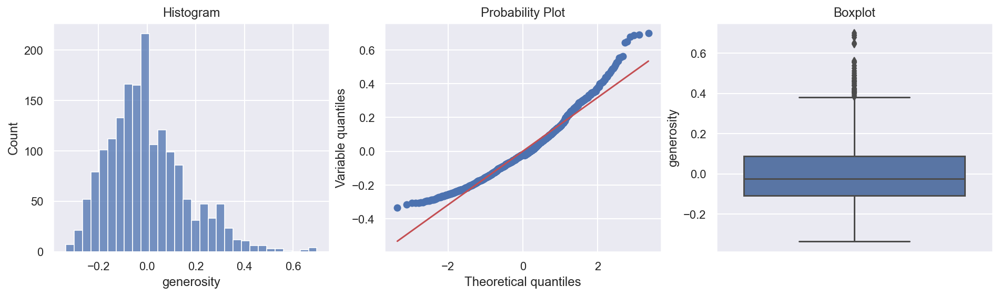

In [86]:
# let's find outliers in generosity
diagnostic_plots(mean_imputed, 'generosity')

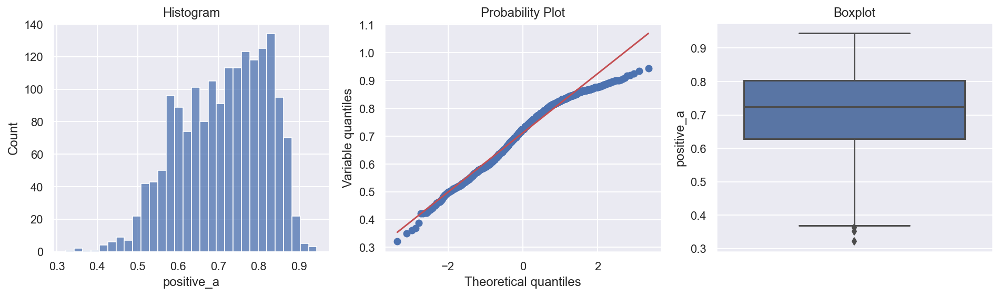

In [87]:
# let's find outliers in positive_a
diagnostic_plots(mean_imputed, 'positive_a')

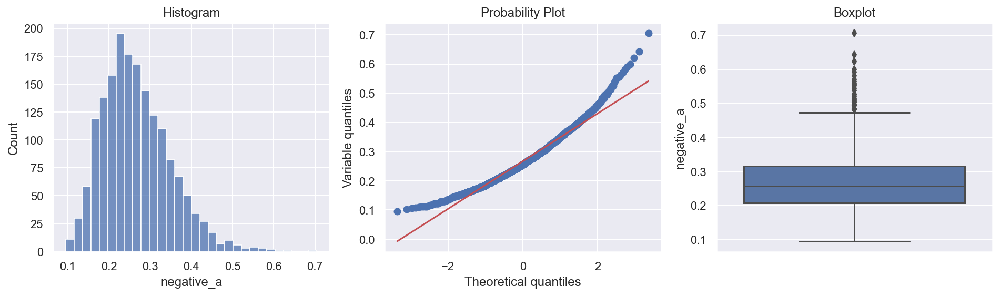

In [88]:
# let's find outliers in negative_a
diagnostic_plots(mean_imputed, 'negative_a')

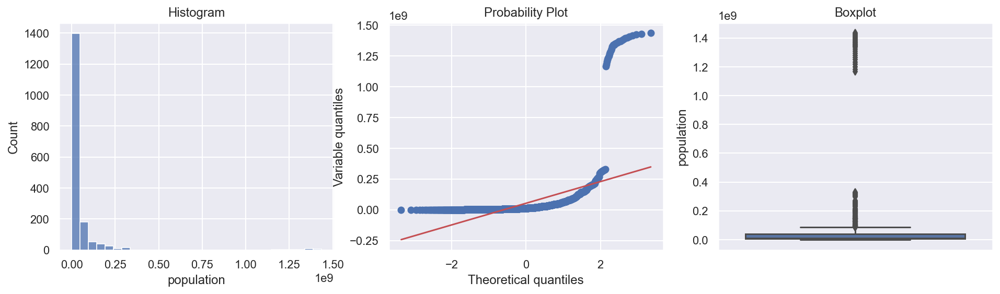

In [89]:
# let's find outliers in population
diagnostic_plots(mean_imputed, 'population')

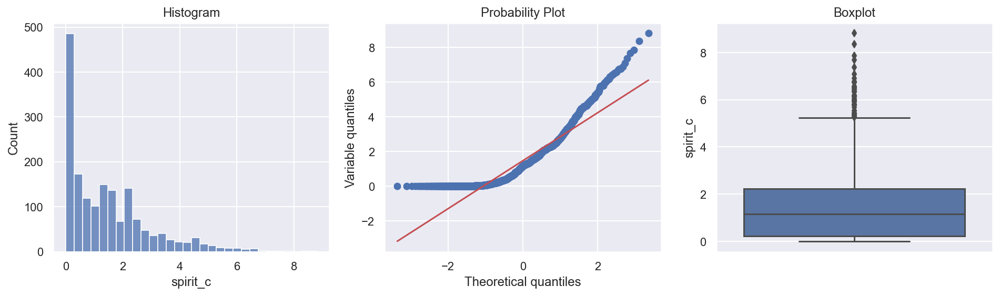

In [90]:
# let's find outliers in spirit_c
diagnostic_plots(mean_imputed, 'spirit_c')

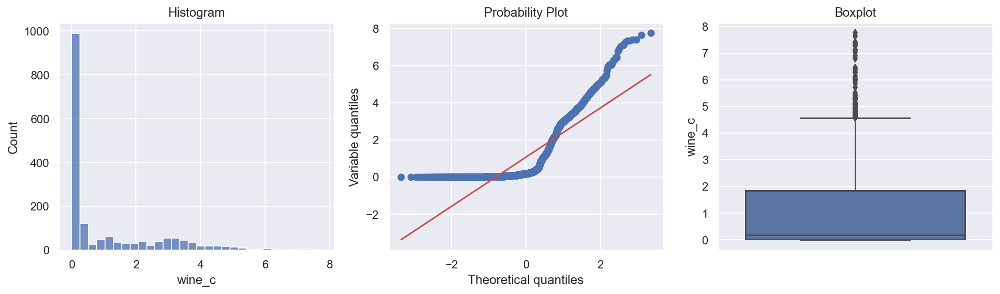

In [91]:
# let's find outliers in wine_c
diagnostic_plots(mean_imputed, 'wine_c')

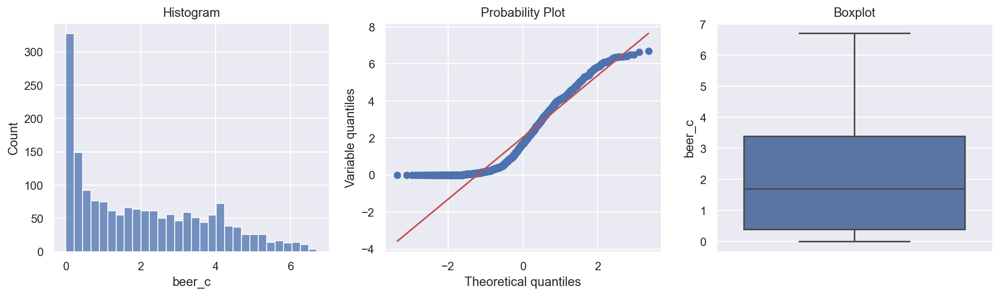

In [92]:
# let's find outliers in beer_c
diagnostic_plots(mean_imputed, 'beer_c')

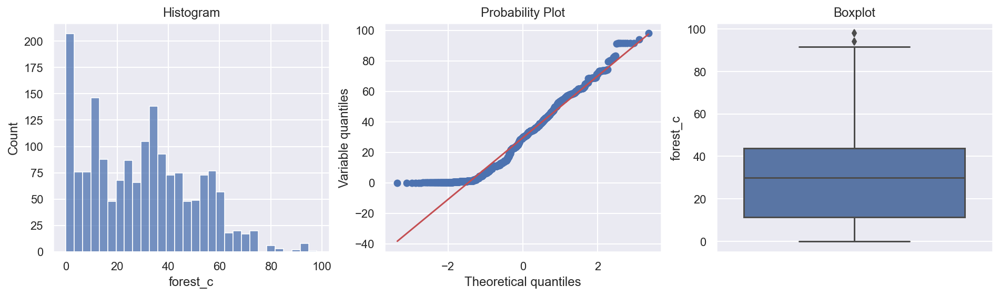

In [93]:
# let's find outliers in forest_c
diagnostic_plots(mean_imputed, 'forest_c')

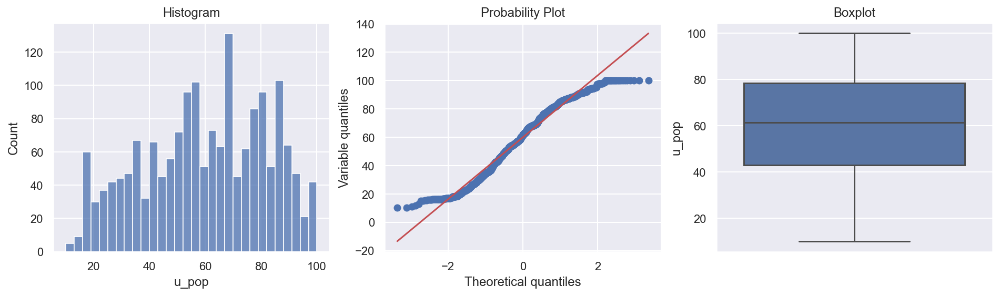

In [94]:
# let's find outliers in u_pop
diagnostic_plots(mean_imputed, 'u_pop')

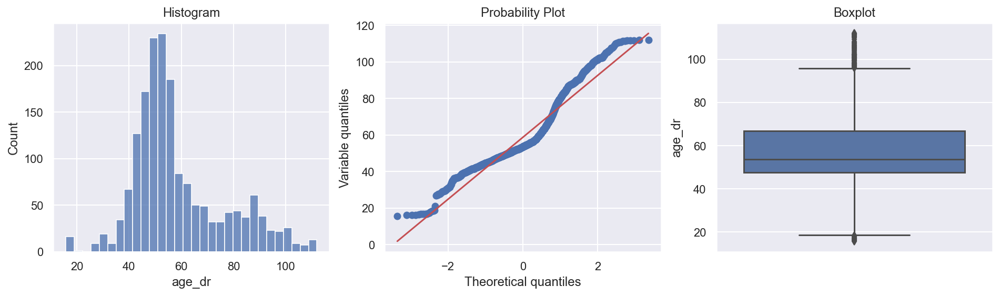

In [95]:
# let's find outliers in age_dr
diagnostic_plots(mean_imputed, 'age_dr')

#### Finding boundaries

In [96]:
def find_skewed_boundaries(df, variable, distance):

    # Let's calculate the boundaries outside which sit the outliers
    # for skewed distributions

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

    return upper_boundary, lower_boundary

In [97]:
mean_imputed.columns

Index(['Unnamed: 0', 'country', 'year', 'happiness_s', 'log_gdp', 'social_s',
       'life_ex', 'life_choices', 'generosity', 'corruption', 'positive_a',
       'negative_a', 'population', 'spirit_c', 'wine_c', 'beer_c', 'forest_c',
       'u_pop', 'age_dr'],
      dtype='object')

In [98]:
# find limits for social_s

social_s_upper_limit, social_s_lower_limit = find_skewed_boundaries(
    mean_imputed, 'social_s', 1.5)
social_s_upper_limit, social_s_lower_limit

(1.1385, 0.5185)

In [99]:
# find limits for life_ex

life_ex_upper_limit, life_ex_lower_limit = find_skewed_boundaries(
    mean_imputed, 'life_ex', 1.5)
life_ex_upper_limit, life_ex_lower_limit

(82.65000000000002, 44.64999999999999)

In [100]:
# find limits for life_choices

life_choices_upper_limit, life_choices_lower_limit = find_skewed_boundaries(
    mean_imputed, 'life_choices', 1.5)
life_choices_upper_limit, life_choices_lower_limit

(1.1669999999999998, 0.3350000000000001)

In [101]:
mean_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1745 entries, 0 to 1744
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    1745 non-null   int64  
 1   country       1745 non-null   object 
 2   year          1745 non-null   int64  
 3   happiness_s   1745 non-null   float64
 4   log_gdp       1745 non-null   float64
 5   social_s      1745 non-null   float64
 6   life_ex       1745 non-null   float64
 7   life_choices  1745 non-null   float64
 8   generosity    1745 non-null   float64
 9   corruption    1745 non-null   float64
 10  positive_a    1745 non-null   float64
 11  negative_a    1745 non-null   float64
 12  population    1745 non-null   float64
 13  spirit_c      1745 non-null   float64
 14  wine_c        1745 non-null   float64
 15  beer_c        1745 non-null   float64
 16  forest_c      1745 non-null   float64
 17  u_pop         1745 non-null   float64
 18  age_dr        1745 non-null 

In [102]:
only_numeric = mean_imputed.copy()

In [103]:
only_numeric.drop(columns=['country'], axis=1, inplace=True)

In [104]:
Q1 = only_numeric.quantile(0.25)
Q3 = only_numeric.quantile(0.75)
IQR = Q3-Q1

In [105]:
# Defining upper and lower outliers
outliers_df = ((only_numeric < (Q1 - 1.5 * IQR)) | (only_numeric > (Q3 + 1.5 * IQR))).sum()

In [106]:
# Sorting outliers according to number of observations 1.5*IQR
print('Outliers defined by IQR *1.5.')
outliers_df.sort_values(ascending=False)

Outliers defined by IQR *1.5.


population      192
corruption      163
age_dr           92
wine_c           72
spirit_c         45
social_s         44
generosity       37
negative_a       31
life_ex          22
life_choices     11
positive_a        3
forest_c          2
year              0
log_gdp           0
happiness_s       0
beer_c            0
u_pop             0
Unnamed: 0        0
dtype: int64

In [107]:
pct_missing = outliers_df * 100 / len(only_numeric)
print('Percentage of data missing with Outliers defined by IQR *1.5')
pct_missing.sort_values(ascending=False)

Percentage of data missing with Outliers defined by IQR *1.5


population      11.002865
corruption       9.340974
age_dr           5.272206
wine_c           4.126074
spirit_c         2.578797
social_s         2.521490
generosity       2.120344
negative_a       1.776504
life_ex          1.260745
life_choices     0.630372
positive_a       0.171920
forest_c         0.114613
year             0.000000
log_gdp          0.000000
happiness_s      0.000000
beer_c           0.000000
u_pop            0.000000
Unnamed: 0       0.000000
dtype: float64

In [108]:
outliers_df3 = ((only_numeric < (Q1 - 3 * IQR)) | (only_numeric > (Q3 + 3 * IQR))).sum()

In [109]:
# Sorting outliers according to number of observations
print('Outliers defined by IQR *3')
outliers_df3.sort_values(ascending=False)

Outliers defined by IQR *3


population      124
corruption       28
wine_c            6
generosity        4
spirit_c          2
negative_a        1
Unnamed: 0        0
u_pop             0
forest_c          0
beer_c            0
positive_a        0
year              0
life_choices      0
life_ex           0
social_s          0
log_gdp           0
happiness_s       0
age_dr            0
dtype: int64

In [110]:
pct_missing3 = outliers_df3 * 100 / len(only_numeric)
print('Percentage of data missing with Outliers defined by IQR *3.')
pct_missing3.sort_values(ascending=False)

Percentage of data missing with Outliers defined by IQR *3.


population      7.106017
corruption      1.604585
wine_c          0.343840
generosity      0.229226
spirit_c        0.114613
negative_a      0.057307
Unnamed: 0      0.000000
u_pop           0.000000
forest_c        0.000000
beer_c          0.000000
positive_a      0.000000
year            0.000000
life_choices    0.000000
life_ex         0.000000
social_s        0.000000
log_gdp         0.000000
happiness_s     0.000000
age_dr          0.000000
dtype: float64

In [111]:
only_numeric.columns

Index(['Unnamed: 0', 'year', 'happiness_s', 'log_gdp', 'social_s', 'life_ex',
       'life_choices', 'generosity', 'corruption', 'positive_a', 'negative_a',
       'population', 'spirit_c', 'wine_c', 'beer_c', 'forest_c', 'u_pop',
       'age_dr'],
      dtype='object')

In [112]:
import seaborn as sns

'Please remove ## if you want to save visualisation to your computer'

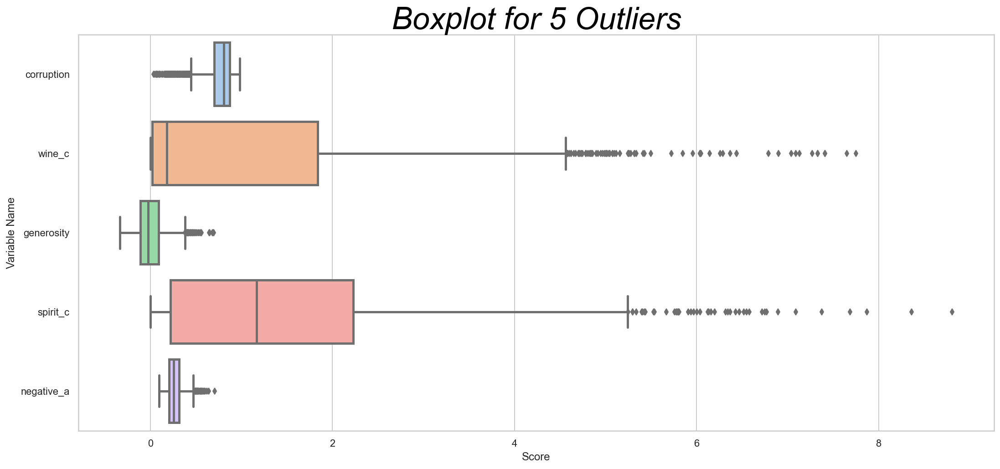

In [113]:
plt.figure(figsize=(18,8))
sns.set_theme(style='whitegrid')
sns.set_palette('pastel')

# Labelling chart
plt.title('Boxplot for 5 Outliers', fontsize = 34.0, color='Black', fontstyle='italic')

plt.xlabel('Score')
plt.ylabel('Variable Name')

outliers5 = only_numeric[['corruption','wine_c','generosity',
                         'spirit_c','negative_a']]


sns.boxplot(data=outliers5,linewidth=2.5, orient='h');
                      
#
'Please remove ## if you want to save visualisation to your computer'    
# Saving as image and pdf
##plt.savefig('Vis_Boxplot_5_Outliers.png',dpi=100)
##plt.savefig('Visualisation of Boxplot for 5 Outliers.pdf')

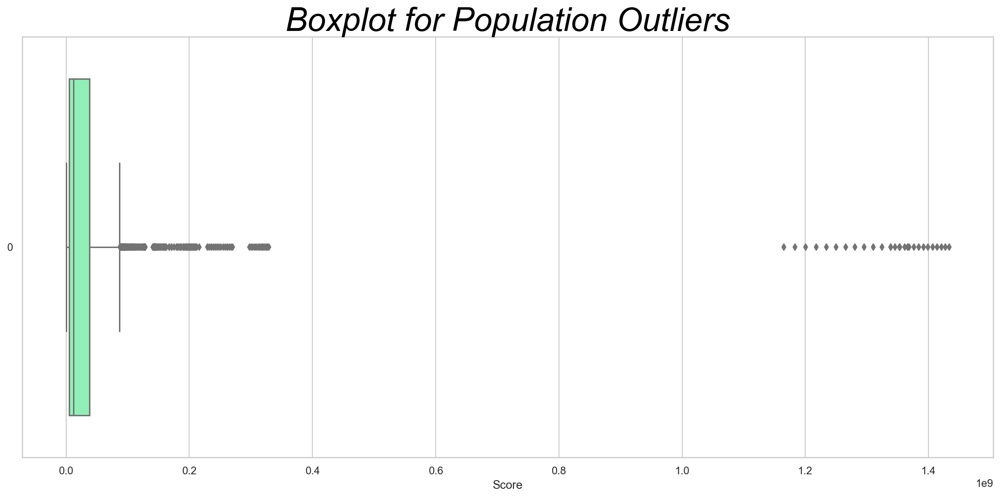

In [114]:
plt.figure(figsize=(18,8))
sns.set_theme(style='whitegrid')

# Labelling chart
plt.title('Boxplot for Population Outliers', fontsize = 34.0, color='Black', fontstyle='italic')

plt.xlabel('Score')

outlier1 = only_numeric['population']

sns.boxplot(data=outlier1,palette='rainbow',orient='h');

##### Our data being from qualitative reliable sources, we assume that there is no error of measurement nor incorrectly entered data. Consequentially, we will firstly run our model including those outliers and evaluate their performance, before considering dropping them, dependent on our results. Also, there isn't a substantial percentage number of outliers. We will be standard scaling these outliers to minimise their impact on our models. 

In [115]:
mean_imputed.sample(4)

,Unnamed: 0,country,year,happiness_s,log_gdp,social_s,life_ex,life_choices,generosity,corruption,positive_a,negative_a,population,spirit_c,wine_c,beer_c,forest_c,u_pop,age_dr
1705,1705,Vietnam,2019,5.467,8.992,0.848,68.1,0.952,-0.126,0.788,0.751,0.186,96462108.0,0.21000,0.02000,3.18000,46.850208,36.628,44.440834
1016,1016,Moldova,2015,6.017,9.246,0.840,62.9,0.595,-0.090,0.943,0.590,0.281,4070705.0,2.34000,2.68000,1.52000,11.748252,42.490,34.845214
1104,1104,New Zealand,2008,7.381,10.528,0.944,71.6,0.893,0.298,0.334,0.854,0.232,4278156.0,1.30162,3.03761,4.03074,37.403000,86.280,50.270323
449,449,Egypt,2010,4.669,9.244,0.769,60.0,0.486,-0.076,0.826,0.567,0.276,82761244.0,0.07000,0.02000,0.11000,0.065940,43.019,59.614701


In [116]:
mean_imputed.year.nunique()

15

In [117]:
mean_imputed.country.nunique()

153

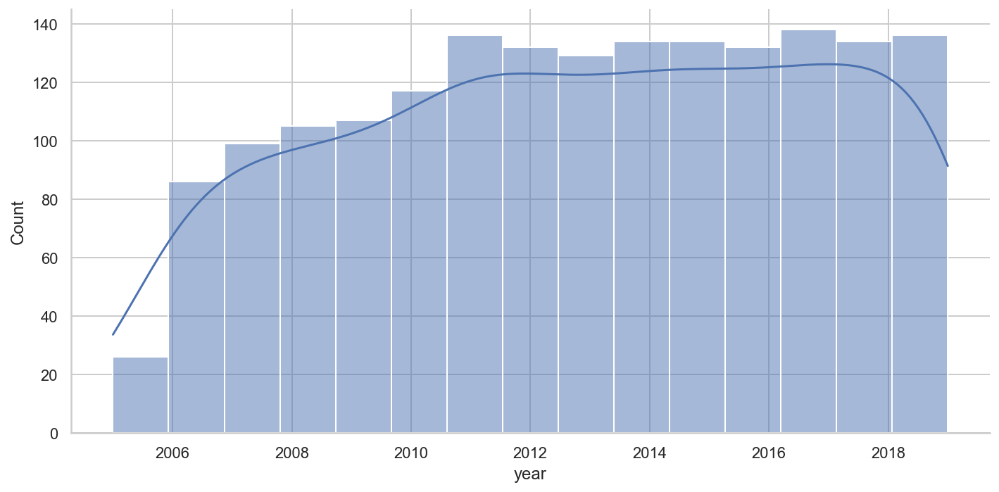

In [118]:
# Distribution plot for year. The naming is wrong, it hasn't been imputed.
sns.displot(mean_imputed['year'],kde=True, height=5, aspect=2);

In [119]:
mean_imputed['year'].skew()

-0.14117330111837056

We won't be dummifying the year column as it's approximately normally distributed.

We will be dropping the country name column as each feature has country data within itself and therefore it would not add any value to our analysis.

In [120]:
# Dropping Country column
mean_imputed.drop(columns='country', axis=1, inplace=True)

In [121]:
dfv1 = mean_imputed

In [122]:
dfv1.sample()

,Unnamed: 0,year,happiness_s,log_gdp,social_s,life_ex,life_choices,generosity,corruption,positive_a,negative_a,population,spirit_c,wine_c,beer_c,forest_c,u_pop,age_dr
673,673,2009,5.472,8.975,0.779,60.26,0.784,0.191,0.911,0.865,0.193,238620554.0,0.00779,0.00185,0.0636,53.166588,49.134,51.240705


In [123]:
# Moving feature column to the end of my dataframe
column_to_reorder = dfv1.pop('happiness_s')
dfv1.insert(len(dfv1.columns),'happiness_s', column_to_reorder)
dfv1

,Unnamed: 0,year,log_gdp,social_s,life_ex,life_choices,generosity,corruption,positive_a,negative_a,population,spirit_c,wine_c,beer_c,forest_c,u_pop,age_dr,happiness_s
0,0,2008,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258,27722281.0,0.01809,0.00089,0.00857,1.850994,23.320,102.078659,3.724
1,1,2009,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237,28394806.0,0.00000,0.00000,0.00972,1.850994,23.528,102.249014,4.402
2,2,2010,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275,29185511.0,0.00000,0.00000,0.01000,1.850994,23.737,102.045823,4.758
3,3,2011,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267,30117411.0,0.00000,0.00000,0.00000,1.850994,23.948,100.224461,3.832
4,4,2012,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268,31161378.0,0.00000,0.00000,0.00000,1.850994,24.160,97.925947,3.783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1740,1740,2015,7.992,0.736,53.80,0.667,-0.123,0.810,0.715,0.179,13814642.0,0.36000,0.06000,1.93000,45.689363,32.385,83.138590,3.703
1741,1741,2016,7.984,0.768,54.40,0.733,-0.095,0.724,0.738,0.209,14030338.0,0.35000,0.05000,1.93000,45.570273,32.296,83.576729,3.735
1742,1742,2017,8.016,0.754,55.00,0.753,-0.098,0.751,0.806,0.224,14236599.0,0.39000,0.05000,1.93000,45.451183,32.237,83.466245,3.638
1743,1743,2018,8.049,0.775,55.60,0.763,-0.068,0.844,0.710,0.212,14438812.0,0.39000,0.04000,1.20000,45.332093,32.209,82.951113,3.616


In [124]:
# Writing file to CSV to use in modelling notebook
happy = dfv1.to_csv('happy.csv', index=False)